In [1]:
import pandas as pd

df = pd.read_csv("./veri776_metadata.csv") 
df_train = df[df['split'] == 'train'].reset_index(drop=True)
df_val = df[df['split'] == 'validation'].reset_index(drop=True)
df_val

,label,cam_id,split,is_query,is_gallery,path
0,2,2,validation,True,True,veri776_ds\0002_c002_00030600_0.jpg
1,2,3,validation,True,True,veri776_ds\0002_c003_00084280_0.jpg
2,2,4,validation,True,True,veri776_ds\0002_c004_00084250_0.jpg
3,2,5,validation,True,True,veri776_ds\0002_c005_00084980_0.jpg
4,2,6,validation,True,True,veri776_ds\0002_c006_00083605_0.jpg
...,...,...,...,...,...,...
11574,776,7,validation,False,True,veri776_ds\0776_c007_00000595_0.jpg
11575,776,7,validation,False,True,veri776_ds\0776_c007_00000610_0.jpg
11576,776,7,validation,False,True,veri776_ds\0776_c007_00000620_0.jpg
11577,776,7,validation,False,True,veri776_ds\0776_c007_00000625_0.jpg


In [6]:
import argparse
import torch
from torchvision import transforms
from torch.utils.data import DataLoader
import torch.nn.functional as F
from tqdm import tqdm
import numpy as np
from metrics.eval_reid import *
from data.triplet_sampler import *
from typing import OrderedDict
from processor import get_model
import torch.multiprocessing
import os
import yaml
from utils import re_ranking

with open("./10/config.yaml", "r") as stream:
        data = yaml.safe_load(stream)


teste_transform = transforms.Compose([
                transforms.Resize((data['y_length'],data['x_length']), antialias=True),
                transforms.Normalize(data['n_mean'], data['n_std']),

])                  

if data['half_precision']:
    scaler = torch.cuda.amp.GradScaler()
else:
    scaler=False


if data['dataset'] == 'Veri776':
    data_q = CustomDataSet4Veri776_withviewpont(data['query_list_file'], data['query_dir'], data['train_keypoint'], data['test_keypoint'], is_train=False, transform=teste_transform)
    data_g = CustomDataSet4Veri776_withviewpont(data['gallery_list_file'], data['teste_dir'], data['train_keypoint'], data['test_keypoint'], is_train=False, transform=teste_transform)
    data_q = DataLoader(data_q, batch_size=data['BATCH_SIZE'], shuffle=False, num_workers=data['num_workers_teste'])
    data_g = DataLoader(data_g, batch_size=data['BATCH_SIZE'], shuffle=False, num_workers=data['num_workers_teste'])


# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

model = get_model(data, torch.device("cpu"))

# One of the saved weights last.pt best_CMC.pt best_mAP.pt
path_weights = './10/best_mAP.pt'

try:
    model.load_state_dict(torch.load(path_weights, map_location='cpu')) 
except RuntimeError:
    ### nn.Parallel adds "module." to the dict names. Although like said nn.Parallel can incur in weird results in some cases 
    tmp = torch.load(path_weights, map_location='cpu')
    tmp = OrderedDict((k.replace("module.", ""), v) for k, v in tmp.items())
    model.load_state_dict(tmp)


model = model.to(device)
model.eval()

mean = False
l2 = True

C:\Users\pnkdl\AppData\Local\Temp\ipykernel_13688\1084257787.py:28: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


Missed viewpoint for  0  images!
Missed viewpoint for  0  images!
Selected device: cuda


Using cache found in C:\Users\pnkdl/.cache\torch\hub\XingangPan_IBN-Net_master
Using cache found in C:\Users\pnkdl/.cache\torch\hub\XingangPan_IBN-Net_master
C:\Users\pnkdl\AppData\Local\Temp\ipykernel_13688\1084257787.py:50: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the 

In [39]:
# model.eval()
# re_escala = torchvision.transforms.Resize((256,256), antialias=True)

# # if data['dataset'] == 'VERIWILD':
# #     queries_names = np.loadtxt('/home/eurico/VERI-Wild/train_test_split/test_3000_id_query.txt', dtype='str_')
# #     galeria_names = np.loadtxt('/home/eurico/VERI-Wild/train_test_split/test_3000_id.txt', dtype='str_')
# # else:
# #     queries_names = np.loadtxt(data['query_list_file'], dtype='str_')
# #     galeria_names = np.loadtxt(data['gallery_list_file'], dtype='str_')
# ###needed lists
# qf = []
# gf = []
# q_camids = []
# g_camids = []
# q_vids = []
# g_vids = []
# q_images = []
# g_images =  []
# count_imgs = 0
# blend_ratio =0.3
# with torch.no_grad():
#     for image, q_id, cam_id, view_id  in tqdm(data_q, desc='Query infer (%)', bar_format='{l_bar}{bar:20}{r_bar}'):
#         image = image.to(device)
#         if scaler:
#             with torch.autocast(device_type="cuda", dtype=torch.float16):
#                 _, _, ffs, activations = model(image, cam_id, view_id)
#         else:
#             _, _, ffs, activations = model(image, cam_id, view_id)

#         # if not data['dataset'] == "VehicleID":
#         #     save_activ(activations, count_imgs, data, re_escala, queries_names, blend_ratio)
                
#         count_imgs += activations[0].shape[0]
#         end_vec = []
#         for item in ffs:
#             end_vec.append(F.normalize(item))
#         qf.append(torch.cat(end_vec, 1))
#         q_vids.append(q_id)
#         q_camids.append(cam_id)

#     del q_images
#     count_imgs = 0
#     for image, g_id, cam_id, view_id in tqdm(data_g, desc='Gallery infer (%)', bar_format='{l_bar}{bar:20}{r_bar}'):
#         image = image.to(device)
#         if scaler:
#             with torch.autocast(device_type="cuda", dtype=torch.float16):
#                 _, _, ffs, activations = model(image, cam_id, view_id)
#         else:
#             _, _, ffs, activations = model(image, cam_id, view_id)

#         # if not data['dataset'] == "VehicleID":
#         #     save_activ(activations, count_imgs, data, re_escala, galeria_names, blend_ratio, "_g")

#         end_vec = []
#         for item in ffs:
#             end_vec.append(F.normalize(item))
#         gf.append(torch.cat(end_vec, 1))
#         g_vids.append(g_id)
#         g_camids.append(cam_id)

#         count_imgs += activations[0].shape[0]

#     del g_images

# qf = torch.cat(qf, dim=0)
# gf = torch.cat(gf, dim=0)

# # with open(args.path_weights +'q_feats.npy', 'wb') as f:
# #     np.save(f, qf.cpu().numpy())
# # with open(args.path_weights +'g_feats.npy', 'wb') as f:
# #     np.save(f, gf.cpu().numpy())

# m, n = qf.shape[0], gf.shape[0]   

# distmat =  torch.pow(qf, 2).sum(dim=1, keepdim=True).expand(m, n) + \
#         torch.pow(gf, 2).sum(dim=1, keepdim=True).expand(n, m).t()
# distmat.addmm_(qf, gf.t(),beta=1, alpha=-2)
# distmat = torch.sqrt(distmat).cpu().numpy()

# q_camids = torch.cat(q_camids, dim=0).cpu().numpy()
# g_camids = torch.cat(g_camids, dim=0).cpu().numpy()
# q_vids = torch.cat(q_vids, dim=0).cpu().numpy()
# g_vids = torch.cat(g_vids, dim=0).cpu().numpy()   

# # with open(args.path_weights +'distmat.npy', 'wb') as f:
# #     np.save(f, distmat)
# # with open(args.path_weights +'q_view.npy', 'wb') as f:
# #     np.save(f, q_view_id)
# # with open(args.path_weights +'g_view.npy', 'wb') as f:
# #     np.save(f, g_view_id)
# del qf, gf


# # cmc, mAP = eval_func(distmat, q_vids, g_vids, q_camids, g_camids, remove_junk=False)
# # print(f'mAP = {mAP},  CMC1= {cmc[0]}, CMC5= {cmc[4]}')

# # cmc, mAP

In [16]:
import torch.nn as nn


class EmbeddingModel(nn.Module):
    def __init__(self, original_model):
        super(EmbeddingModel, self).__init__()
        self.original_model = original_model
    
    def forward(self, x):
        _, embs, _, _ = self.original_model(x, 0, 0)
        # Возвращаем объединенные эмбеддинги из всех ветвей
        return torch.cat(embs, dim=1)

In [17]:
embedding_model = EmbeddingModel(model)


In [18]:
teste_transform = transforms.Compose([
    transforms.ToTensor(),
                transforms.Resize((data['y_length'],data['x_length']), antialias=True),
                transforms.Normalize(data['n_mean'], data['n_std']),

])  

In [19]:

from oml import datasets as d
from oml.inference import inference
from oml.metrics import calc_retrieval_metrics_rr
from oml.models import ViTExtractor
from oml.registry import get_transforms_for_pretrained
from oml.retrieval import RetrievalResults



train = d.ImageLabeledDataset(df_train, transform=teste_transform)
val = d.ImageQueryGalleryLabeledDataset(df_val, transform=teste_transform)



# validation by retrieving relevant items
embeddings = inference(embedding_model, val, batch_size=192, num_workers=0)


In [20]:
rr = RetrievalResults.from_embeddings(embeddings, val, n_items=10)
print(1)
# rr = AdaptiveThresholding(n_std=2).process(rr)
# print(1)
print(calc_retrieval_metrics_rr(rr, map_top_k=(100,), cmc_top_k=(1,)))

1


MAP@100: 100%|██████████| 1678/1678 [00:00<00:00, 14751.53it/s]


{'cmc': {1: tensor(0.9952)}, 'precision': {5: tensor(0.9844)}, 'map': {100: tensor(0.9899)}}


c:\Programming\veri_metric\unicom\venv\lib\site-packages\oml\retrieval\retrieval_results.py:455: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


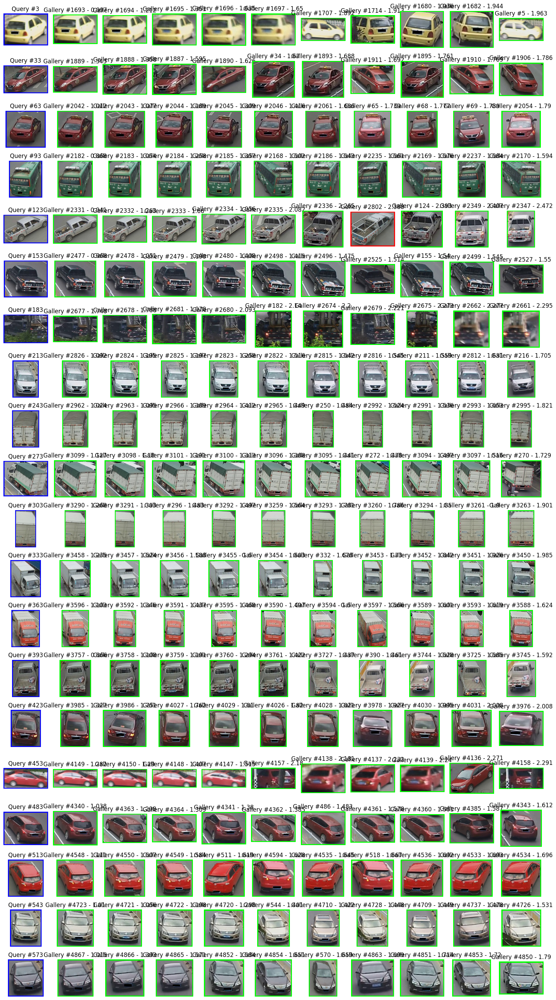

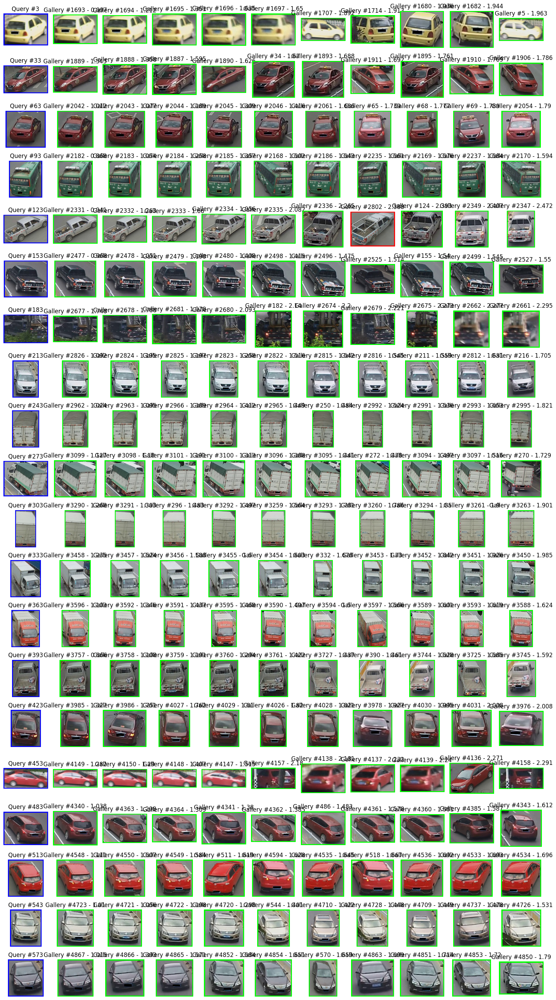

In [21]:
rr.visualize(query_ids=[i * 30 + 3 for i in range(20)], n_gt_to_show = 0, n_galleries_to_show = 10, dataset=val, show=True)


In [22]:
labels = [x['labels'] for x in val]

In [37]:
df_val['path'][0]

'veri776_ds\\0002_c002_00030600_0.jpg'

In [23]:
import plotly.express as px
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2, random_state=42, perplexity=30)
embeddings_2d = tsne.fit_transform(embeddings)

df = pd.DataFrame({
    "x": embeddings_2d[:, 0],
    "y": embeddings_2d[:, 1],
    "label": labels,
})

fig = px.scatter(
    df, 
    x="x", 
    y="y", 
    color="label",
    hover_name="label",
    title="Интерактивный t-SNE с zoom",
    width=800,
    height=600,
)

fig.update_traces(
    marker=dict(size=8, opacity=0.7, line=dict(width=0.5, color='DarkSlateGrey')),
    selector=dict(mode='markers')
)

fig.update_layout(
    hoverlabel=dict(font_size=12),
    legend_title_text='Классы'
)

fig.show()

c:\Programming\veri_metric\unicom\venv\lib\site-packages\joblib\externals\loky\backend\context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[WinError 2] The system cannot find the file specified
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "c:\Programming\veri_metric\unicom\venv\lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
  File "C:\Users\pnkdl\AppData\Local\Programs\Python\Python310\lib\subprocess.py", line 501, in run
    with Popen(*popenargs, **kwargs) as process:
  File "C:\Users\pnkdl\AppData\Local\Programs\Python\Python310\lib\subprocess.py", line 966, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "C:\Users\pnkdl\AppData\Local\Programs\Python\Python310\lib\subprocess.py", line 1435, in _execu